In [1]:
import numpy as np
import pandas as pd
import os, random
import cv2

from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.utils import to_categorical

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report


import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore', message="DataFrame is highly fragmented")
import pickle

In [2]:
base_dir = '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/'

In [3]:
class_folder_names = ['Bengin cases', 'Malignant cases', 'Normal cases']
class_folder_names

['Bengin cases', 'Malignant cases', 'Normal cases']

In [4]:
class_dict = {'Bengin cases':"Bengin", 'Malignant cases':"Malignant", 'Normal cases':"Normal"}

In [5]:
image_paths = []

for cls in class_folder_names:
    print(cls)
    for file_name in os.listdir(base_dir+cls):
        if file_name.split(".")[-1] == 'jpg' or file_name.split(".")[-1] == 'png':
            image_paths.append(os.path.join(base_dir,cls,file_name))

print("A Total images = ", len(image_paths))
print("----------------------")

image_paths[0:10]

Bengin cases
Malignant cases
Normal cases
A Total images =  1097
----------------------


['/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (85).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (109).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (93).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (50).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (11).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (46).jpg',
 '/Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Bengin cases/Bengin case (3

In [6]:
classes = []

for image_path in image_paths:
    classes.append(image_path.split('/')[-2])

classes[0:5]

['Bengin cases',
 'Bengin cases',
 'Bengin cases',
 'Bengin cases',
 'Bengin cases']

In [7]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from keras.preprocessing.image import load_img, img_to_array

# Define your target image size
target_size = (224, 224)

# List to store processed images as arrays
inputs = []

# Loop through each image path in image_paths
for image_path in tqdm(image_paths):
    # Load the image, resize it to target_size, and convert to array
    image = load_img(image_path, target_size=target_size)
    img_array = img_to_array(image)

    # Convert to grayscale
    img_gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)

    # Apply Gaussian blur
    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)

    # Append the blurred image array to inputs
    inputs.append(img_blur)

# Convert inputs list to numpy array
X = np.array(inputs)


100%|██████████████████████████████████████| 1097/1097 [00:06<00:00, 177.99it/s]


In [8]:
le = LabelEncoder()
y = le.fit_transform(classes)
y = np.array(y)

print(y)

[0 0 0 ... 2 2 2]


In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Train data = ", X_train.shape,  y_train.shape)
print("Test data = ", X_test.shape,  y_test.shape)

Train data =  (877, 224, 224) (877,)
Test data =  (220, 224, 224) (220,)


In [10]:
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

print("Flattened Train data = ", X_train_flattened.shape,  y_train.shape)
print("Flattened Test data = ", X_test_flattened.shape,  y_test.shape)

Flattened Train data =  (877, 50176) (877,)
Flattened Test data =  (220, 50176) (220,)


In [11]:
# Create a dictionary to store indices of samples for each class
unique_classes = np.unique(y_train)
class_indices = {class_id: np.where(y_train == class_id)[0] for class_id in unique_classes}

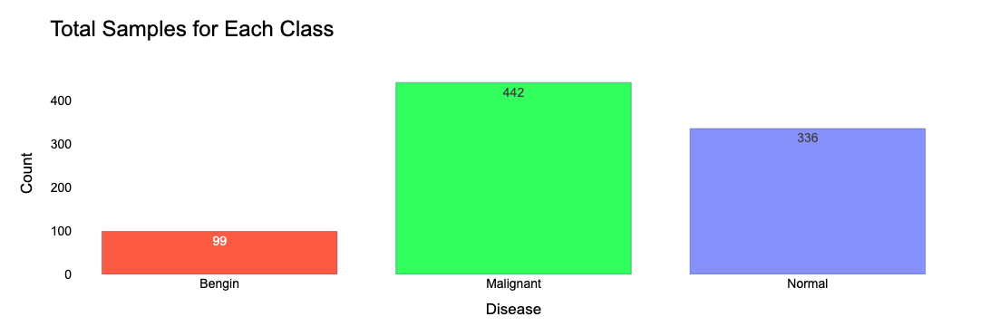

In [22]:
import plotly.express as px

# Calculate the number of images for each class
images_count = [len(class_indices[key]) for key in class_indices.keys()]

# Create a bar plot using Plotly Express
fig = px.bar(
    x=list(class_dict.values()),  # X-axis values (class labels)
    y=images_count,  # Y-axis values (count of images)
    color=list(class_dict.values()),  # Color based on class labels
    labels={'x': 'Disease', 'y': 'Count'},  # Axis labels
    title="Total Samples for Each Class",  # Plot title
    text=images_count,  # Display count as text on bars
    opacity=0.8,  # Set opacity of bars
    color_discrete_sequence=px.colors.qualitative.Light24  # Color scheme for bars
)

# Customize layout
fig.update_layout(
    xaxis_title='Disease',  # X-axis title
    yaxis_title='Count',  # Y-axis title
    title_text='Total Samples for Each Class',  # Plot title
    title_font_size=24,  # Title font size
    font=dict(
        family="Arial",  # Font family
        size=14,  # Font size
        color="black"  # Font color
    ),
    margin=dict(
        l=80, r=50, t=80, b=50  # Adjust margins for better spacing
    ),
    plot_bgcolor='rgba(0,0,0,0)',  # Set plot background color to transparent
    showlegend=False  # Hide legend
)

# Update bar width
fig.update_traces(
    texttemplate='%{text}',  # Text template for bar labels
    textposition='inside',  # Position of text inside bars
    marker=dict(line=dict(color='rgb(8,48,107)', width=0.5)),  # Adjusted width of the marker line
)

# Show the plot
fig.show()


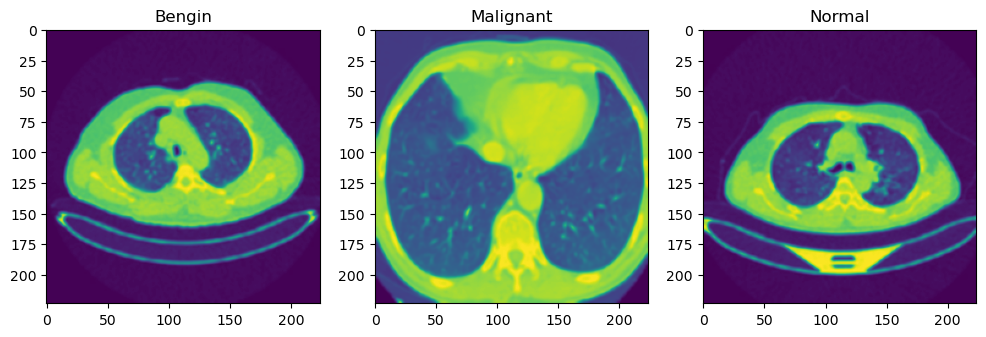

In [15]:
# Displaying sample images for each class randomly.

plt.figure(figsize=(12, 5))

for i, (class_id, indices) in enumerate(class_indices.items()):
    random_index = np.random.choice(indices)
    random_image = X_train[random_index].astype(np.uint8)

    plt.subplot(1, len(unique_classes), i + 1)
    plt.imshow(random_image)
    plt.title(class_dict[class_folder_names[class_id]])
    plt.axis('on')

plt.show()

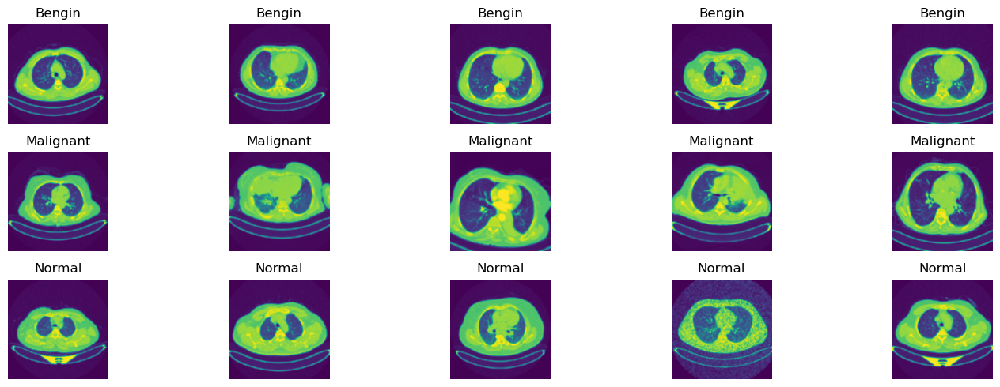

In [16]:
# Displaying 7 sample images for each class randomly.

selected_classes = [0,1,2]
total_images_per_class = 5

plt.figure(figsize=(15, 5))

for c, selected_class in enumerate(selected_classes):

    # Get indices of samples for the selected class
    indices_for_selected_class = np.where(y_train == selected_class)[0]
    random_indices = np.random.choice(indices_for_selected_class, total_images_per_class, replace=False)

    # Display images for the current selected class
    for i, idx in enumerate(random_indices):
        plt.subplot(len(selected_classes), total_images_per_class, c * total_images_per_class + i + 1)
        plt.imshow(X_train[idx].astype(np.uint8))
        plt.title(class_dict[class_folder_names[selected_class]])
        plt.axis('off')

plt.tight_layout()
plt.show()

In [17]:
# Assuming X_train is your image data array
num_samples, height, width = X_train.shape

# Reshape the image data to a 2D array
X_train_reshaped = X_train.reshape(num_samples, height * width)

# Print the shape of the reshaped array
print("Shape of X_train_reshaped:", X_train_reshaped.shape)

Shape of X_train_reshaped: (877, 50176)


In [18]:
# Apply PCA to reduce dimensions to 2 for visualization

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_flattened)
X_train_pca.shape

(877, 2)

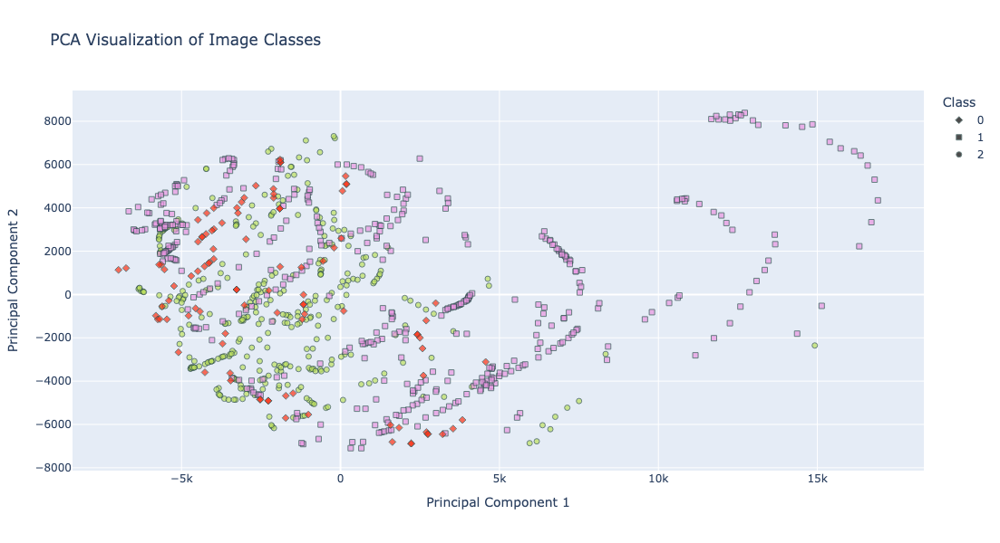

In [20]:
import plotly.express as px

# Generate hover text for each point
hover_text = [f"Index: {index}, Class: {class_label}" for index, class_label in enumerate(y_train)]

# Create a scatter plot for PCA-transformed data
fig = px.scatter(
    x=X_train_pca[:, 0], 
    y=X_train_pca[:, 1], 
    color=y_train,
    hover_name=hover_text,
    symbol=y_train,
    title='PCA Visualization of Image Classes',
    labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'},  # Axis labels
    color_continuous_scale=px.colors.qualitative.Light24,  # Color scale for continuous color
    symbol_sequence=['circle', 'square', 'diamond'],  # Symbol sequence for different classes
    opacity=0.7,  # Set opacity of markers
    size_max=10,  # Maximum marker size
)

# Customize layout
fig.update_layout(
    coloraxis_showscale=False,  # Hide the color scale
    showlegend=True,  # Show legend
    legend_title_text='Class',  # Legend title
    legend_traceorder='reversed',  # Reverse legend order for better readability
    width=800,  # Set plot width
    height=600,  # Set plot height
)

# Update marker styles
fig.update_traces(
    marker=dict(
        line=dict(width=1, color='DarkSlateGray'),  # Marker border settings
        sizemode='diameter'  # Set marker size mode
    ),
    selector=dict(mode='markers')  # Set mode to markers
)

# Show the plot
fig.show()


In [23]:
# Finding outliers by talking high distance sum values

pca_sums = np.sum(X_train_pca, axis=1)

outlier_indexes = []
for idx, row in enumerate(pca_sums):
    if row>15000:
        print(row, idx)
        outlier_indexes.append(idx)

19974.207 7
21249.523 29
22263.992 44
20037.635 51
21807.008 52
15996.95 78
20283.637 134
22436.191 136
20562.14 138
22703.957 213
20550.79 224
22773.848 286
15312.729 326
15464.303 365
15233.006 385
18546.273 390
15546.908 434
16422.234 529
15308.477 544
19766.133 573
22478.707 586
15130.338 617
21100.904 620
22772.541 630
22536.621 654
15630.408 665
21008.146 710
22104.363 721
15437.951 727
20831.21 730
20179.605 753
20867.342 775
15157.438 785
15025.992 793
20970.832 806
20060.574 849


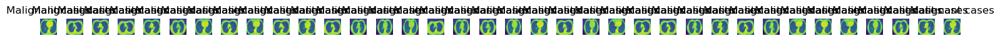

In [24]:
# Displaying outlier images

plt.figure(figsize=(15, 4))

for i, outlier in enumerate(outlier_indexes):
    outlier_image = X_train[outlier]

    plt.subplot(1, len(outlier_indexes), i+1)
    plt.imshow(outlier_image)
    title = class_folder_names[y_train[outlier]]
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [25]:
pca_df = pd.DataFrame(data=X_train_pca, columns=['PC1', 'PC2'])
pca_df['Class'] = y_train
pca_df['Index'] = pca_df.index
pca_df.head()

,PC1,PC2,Class,Index
0,-1633.328003,-953.610535,2,0
1,-632.055542,-3461.916504,2,1
2,-6330.332031,286.656769,2,2
3,-1017.252869,-320.105377,2,3
4,-1963.985718,4525.386719,2,4


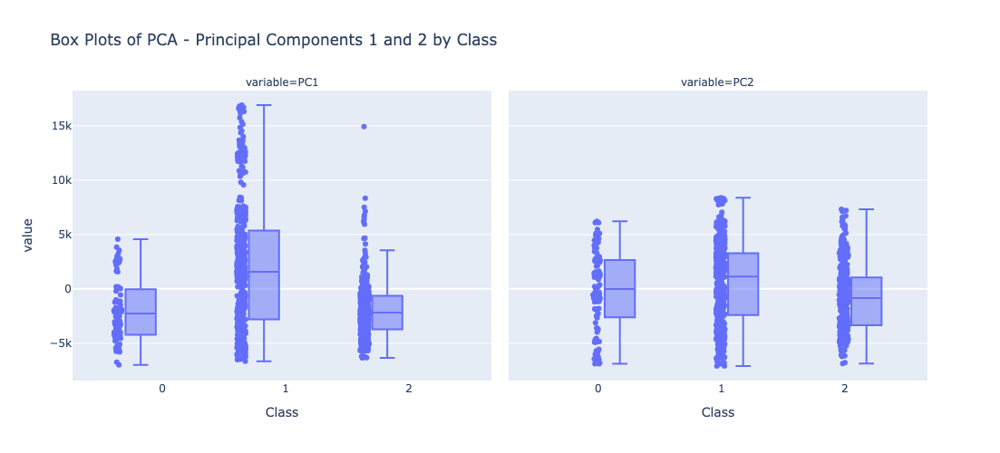

In [26]:
# Create side-by-side box plots for PC1 and PC2 using Plotly

fig = px.box(pca_df, x='Class', y=['PC1', 'PC2'], points="all", facet_col="variable",
             title='Box Plots of PCA - Principal Components 1 and 2 by Class', hover_data={'Index': True})
fig.update_layout(width=1200, height=500)
fig.show()

In [27]:
models = {
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),

}

In [28]:
accuracies = {}

for name, model in models.items():

    model.fit(X_train_flattened, y_train)
    predictions = model.predict(X_test_flattened)

    accuracy = accuracy_score(y_test, predictions)
    accuracies[name] = accuracy

    print(f"{name} accuracy: {accuracy}")

Random Forest accuracy: 0.9681818181818181
Decision Tree accuracy: 0.8727272727272727
Logistic Regression accuracy: 0.9818181818181818
SVM accuracy: 0.9772727272727273
K-Nearest Neighbors accuracy: 0.9636363636363636


In [29]:
best_model_name = max(accuracies, key=accuracies.get)
best_model = models[best_model_name]

print("Best model = ", best_model )

Best model =  LogisticRegression()


In [30]:
# Train the best model
best_model.fit(X_train_flattened, y_train)
best_predictions = best_model.predict(X_test_flattened)

best_predictions

array([1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 1,
       1, 2, 2, 2, 1, 0, 1, 0, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 2, 2, 1, 1, 2, 1, 2, 0, 2, 2, 1, 2,
       0, 1, 2, 1, 2, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 1, 2, 1, 2, 2, 1, 2,
       1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 0, 0, 1, 1, 2, 1, 2, 2, 2, 2, 0,
       1, 1, 0, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 0, 1, 2, 1, 2, 1, 1, 2, 2,
       2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2,
       1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 2, 1, 2, 1, 2, 1, 0, 0, 1,
       2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 2, 1, 1, 1, 2])

In [31]:
# Get weights

if best_model_name == 'Random Forest' or best_model_name == 'Decision Tree':
    coefficients = best_model.feature_importances_
    print(coefficients.shape)

elif best_model_name == 'Logistic Regression':
    coefficients = best_model.coef_.ravel()
    print(coefficients.shape)
else:
    coefficients = None

(150528,)


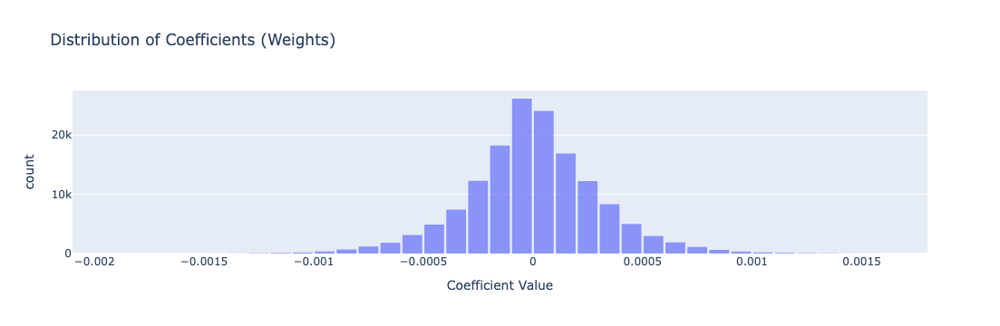

In [32]:
# ploting weights distribution

if coefficients is not None:
    fig = px.histogram(x=coefficients, nbins=50, labels={'x': 'Coefficient Value'}, title='Distribution of Coefficients (Weights)')
    fig.update_layout(bargap=0.1)
    fig.update_traces(opacity=0.7)
    fig.show()

In [33]:
report = classification_report(y_test, best_predictions)
print(report)

              precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.98      0.99      0.99       119
           2       0.97      0.97      0.97        80

    accuracy                           0.98       220
   macro avg       0.99      0.97      0.98       220
weighted avg       0.98      0.98      0.98       220



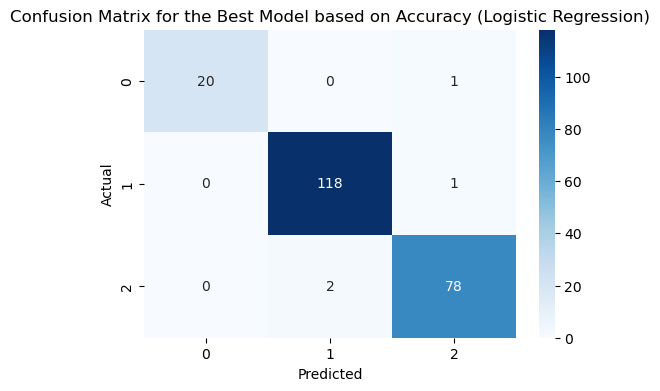

In [34]:
# Calculate and display the confusion matrix for the best model
cm = confusion_matrix(y_test, best_predictions)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=True, yticklabels=True)
plt.title(f'Confusion Matrix for the Best Model based on Accuracy ({best_model_name})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [35]:
# Save the trained model
with open('best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

In [36]:
# Load the saved model
with open('best_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

loaded_model

LogisticRegression()

In [37]:
# Predicting on loaded model with X_test_flattened

predictions = loaded_model.predict(X_test_flattened)
predictions

array([1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 1,
       1, 2, 2, 2, 1, 0, 1, 0, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 2, 2, 1, 1, 2, 1, 2, 0, 2, 2, 1, 2,
       0, 1, 2, 1, 2, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 1, 2, 1, 2, 2, 1, 2,
       1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 0, 0, 1, 1, 2, 1, 2, 2, 2, 2, 0,
       1, 1, 0, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 0, 1, 2, 1, 2, 1, 1, 2, 2,
       2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2,
       1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 2, 1, 2, 1, 2, 1, 0, 0, 1,
       2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 2, 1, 1, 1, 2])

In [38]:
y_test

array([1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 1,
       1, 2, 2, 2, 1, 0, 1, 0, 1, 2, 2, 2, 1, 2, 1, 2, 1, 0, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 2, 2, 1, 1, 2, 1, 2, 0, 2, 2, 1, 2,
       0, 1, 2, 1, 2, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1,
       1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 0, 1, 2, 1, 2, 2, 1, 2,
       1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 1, 0, 0, 1, 1, 2, 1, 2, 2, 2, 2, 0,
       1, 1, 0, 2, 2, 1, 2, 2, 1, 2, 2, 2, 1, 0, 1, 2, 1, 2, 1, 1, 2, 2,
       2, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 2,
       1, 1, 1, 2, 2, 1, 1, 1, 1, 0, 2, 1, 1, 2, 1, 2, 1, 2, 1, 0, 0, 1,
       2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 1, 1, 1, 1, 2])

In [39]:
# Predicting a single image on loaded model

random_image_path = random.choice(image_paths)
actual_class = random_image_path.split('/')[-2]

print("Random Image Path = ", random_image_path)
print("Its original class = ", actual_class)

Random Image Path =  /Users/adityamamidi/Desktop/archive/The IQ-OTHNCCD lung cancer dataset/The IQ-OTHNCCD lung cancer dataset/Normal cases/Normal case (356).jpg
Its original class =  Normal cases


In [40]:
# Image preprocessing for prediction

random_image = load_img(random_image_path, target_size=target_size)
random_img_array = img_to_array(random_image)
random_img_gray = cv2.cvtColor(random_img_array, cv2.COLOR_RGB2GRAY)
random_img_blur = cv2.GaussianBlur(random_img_gray, (5, 5), 0)

flattend_img_array = random_img_blur.reshape(1, -1)
flattend_img_array.shape

(1, 50176)

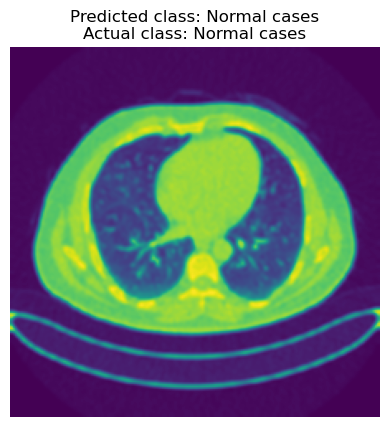

In [41]:
predictions = loaded_model.predict(flattend_img_array)

predicted_class = class_folder_names[predictions[0]]
actual_class = random_image_path.split('/')[-2]
plt.imshow(random_img_blur)
plt.title(f"Predicted class: {predicted_class}\nActual class: {actual_class}")
plt.axis('off')
plt.show()

Bengin cases
0


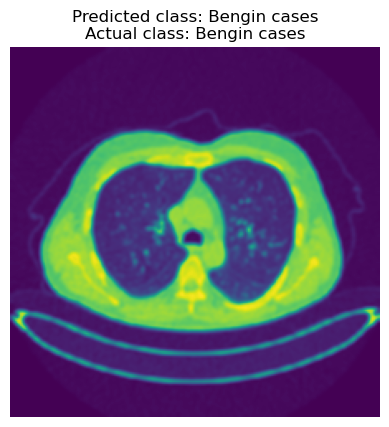

In [42]:
random_image_path = random.choice(image_paths)
actual_class = random_image_path.split('/')[-2]

print(actual_class)

random_image = load_img(random_image_path, target_size=target_size)
random_img_array = img_to_array(random_image)
random_img_gray = cv2.cvtColor(random_img_array, cv2.COLOR_RGB2GRAY)
random_img_blur = cv2.GaussianBlur(random_img_gray, (5, 5), 0)

flattend_img_array = random_img_blur.reshape(1, -1)

predictions = loaded_model.predict(flattend_img_array)

print(predictions[0])


predicted_class = class_folder_names[predictions[0]]
actual_class = random_image_path.split('/')[-2]
plt.imshow(random_img_blur)
plt.title(f"Predicted class: {predicted_class}\nActual class: {actual_class}")
plt.axis('off')
plt.show()